In [76]:
import calendar
import datetime
import json

import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import seaborn as sns
from dateutil import parser
from scipy.sparse import csr_matrix, find
from tqdm.notebook import tqdm

In [ ]:
pd.set_option("display.max_columns", None)

In [ ]:
with open("data/contracts.json", "r") as f:
    contracts_data = json.load(f)

df_contracts = pd.json_normalize(
    contracts_data,
    record_path=["contracts", "mentions"],
    meta=[
        ["contracts", "contract_id"],
        ["contracts", "manifest_id"],
        ["contracts", "canvas_code"],
        ["contracts", "page_number"],
    ],
    errors="ignore",
)


In [ ]:
with open("data/person_mentions.json", "r") as f:
    mention_data = json.load(f)

In [ ]:
print(
    [
        type(mention_data),
        mention_data.keys(),
        type(mention_data["personMentions"]),
        type(mention_data["personMentions"][0]),
        [
            (key, type(value))
            for key, value in mention_data["personMentions"][0].items()
        ],
    ]
)


[<class 'dict'>, dict_keys(['personMentions']), <class 'list'>, <class 'dict'>, [('age', <class 'str'>), ('tag', <class 'str'>), ('name', <class 'dict'>), ('entity', <class 'dict'>), ('gender', <class 'str'>), ('fullName', <class 'str'>), ('professions', <class 'list'>), ('id', <class 'str'>), ('contract_id', <class 'str'>)]]


In [ ]:
df_mentions = pd.json_normalize(mention_data, record_path="personMentions")

In [ ]:
df_mentions_in_contracts = df_mentions.merge(
    df_contracts, left_on="contract_id", right_on="id", how="left"
)

In [ ]:
# simple self join to create the graph as an edge table
df_mentions.reset_index(names=["uid"], inplace=True)
df_mentions_1 = df_mentions.rename(columns={"uid": "uid_1"})
edges_table = pd.merge(df_mentions, df_mentions_1, on="contract_id")[
    [
        "contract_id",
        "tag_x",
        "fullName_x",
        "entity.id_x",
        "tag_y",
        "fullName_y",
        "entity.id_y",
    ]
]

# filter out the self to self edges
edges_table = edges_table.loc[
    edges_table.fullName_x != edges_table.fullName_y
].reset_index(drop=True)


edges_table = edges_table.rename(
    columns={"entity.id_x": "Source", "entity.id_y": "Target"}
)

In [ ]:
# build the graph object
G = nx.from_pandas_edgelist(
    edges_table, source="Source", target="Target", edge_attr=True
)

In [ ]:
def plot_sparse_adj_matrix(G, sort_by=None):
    """
    Plot the sparse adjacency “heatmap” of G.

    Parameters
    ----------
    G : networkx.Graph or DiGraph
        The graph to visualize.
    sort_by : str, optional
        Name of a node attribute to sort by (e.g. "date").
        If None, nodes are in G.nodes() order.
    """
    # 1) Determine node order
    if sort_by is None:
        nodelist = list(G.nodes())
    else:
        # missing attrs get None and sort to front
        nodelist = sorted(G.nodes(), key=lambda n: G.nodes[n].get(sort_by, None))

    # 2) Build sparse COO matrix
    A = nx.to_scipy_sparse_array(G, nodelist=nodelist, format="coo", dtype=int)

    # 3) Extract nonzero entries
    row, col, _ = find(A)

    # 4) Plot
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(
        col,
        row,
        s=0.1,
        color="royalblue",
        alpha=0.2,
    )
    ax.invert_yaxis()
    ax.set_aspect("equal", "box")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(
        "sparse adjacency matrix" + (f" (sorted by '{sort_by}')" if sort_by else "")
    )
    plt.tight_layout()
    plt.show()


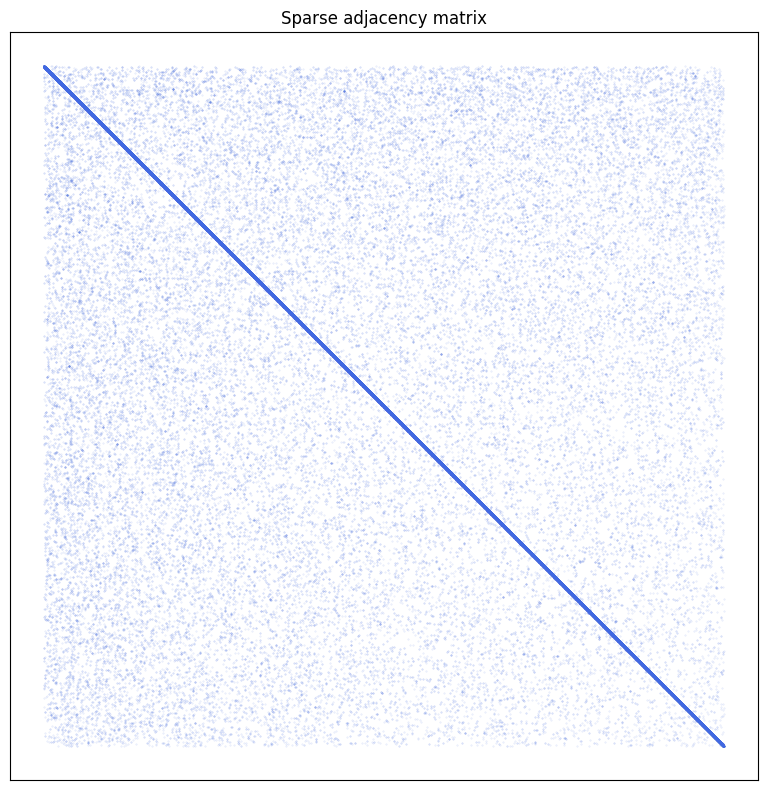

In [57]:
plot_sparse_adj_matrix(G)

In [ ]:
df_contracts_year_only = df_contracts[["id", "date"]]
df_edges_table_with_year = edges_table.merge(
    df_contracts_year_only, left_on="contract_id", right_on="id", how="inner"
)
df_edges_table_with_year = df_edges_table_with_year[
    df_edges_table_with_year["date"] >= "1500-01-01"
]

In [ ]:
def safe_parse_date(s):
    """
    Parse a YYYY-MM-DD string into a datetime.date,
    clamping day > month’s last day down to the month’s end.
    """
    year, month, day = map(int, s.split("-"))
    last = calendar.monthrange(year, month)[1]
    day = min(day, last)
    return datetime.date(year, month, day)

{'f1e0fa88-1ff5-4cc7-8fba-854d148f0306': datetime.date(1599, 7, 20), '1880c962-3d84-4fcf-935d-c03b7cf33704': datetime.date(1599, 7, 20), 'ab7929f4-4cab-427c-8e8a-349f8d0cdff5': datetime.date(1599, 7, 20), '0de6a494-491a-4d57-907a-1cdb956f1ba2': datetime.date(1609, 1, 7), '0d175d5a-0367-4c57-b6b6-2060e83b9040': datetime.date(1625, 2, 10), '2e2b1828-81a8-4a38-900a-a4cca9d08c7a': datetime.date(1625, 2, 10), 'e9a7a436-c6a4-4fa8-a862-095122bd39ff': datetime.date(1625, 2, 10), 'bc3ecc02-652f-42d9-8bba-fc4561152b5a': datetime.date(1653, 8, 30), '2b424f67-f5c7-4ea2-8f26-b8d8b11dcdd7': datetime.date(1669, 12, 18), '9073a473-e3fa-49c3-ac7a-2d5d48523e61': datetime.date(1669, 12, 18), 'f308711b-cd79-4120-a55d-0449f59a8cfb': datetime.date(1620, 7, 8), '34501ffd-a30a-4f12-ba6c-abe6fb86e166': datetime.date(1620, 7, 8), 'd8913184-7782-4f90-9959-e11f0228240e': datetime.date(1620, 7, 8), '8e2b76a6-73bb-495c-b2b6-564a9e745871': datetime.date(1620, 7, 8), '413bf45a-08b9-40de-9fb0-cff18cf86e3d': datetime.d

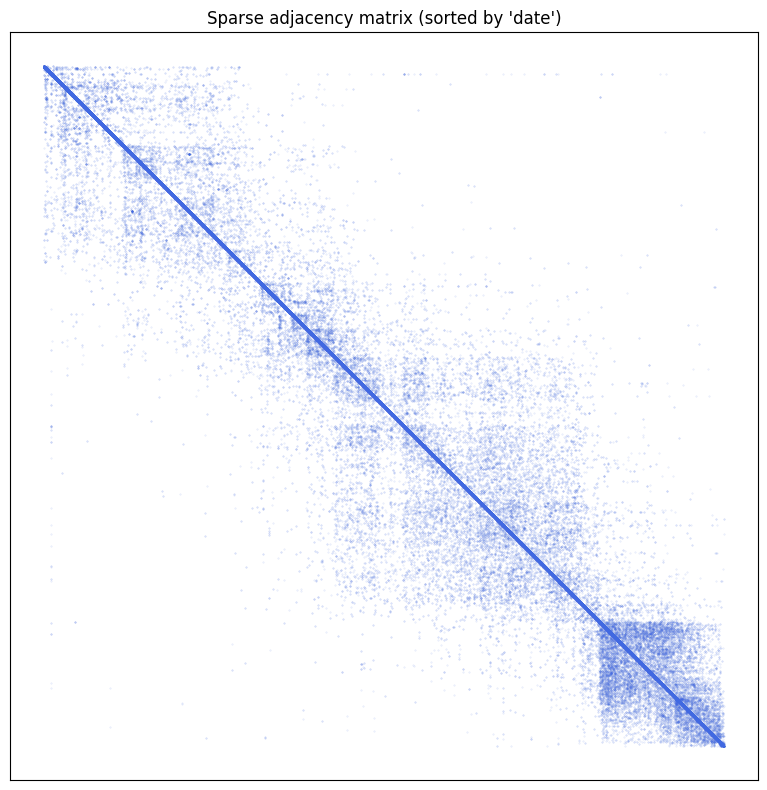

In [ ]:
H = nx.Graph()
for u, v, d_str in zip(
    df_edges_table_with_year.Source,
    df_edges_table_with_year.Target,
    df_edges_table_with_year.date,
):
    d = safe_parse_date(d_str)
    H.add_edge(u, v, date=d)
    for n in (u, v):
        existing = H.nodes[n].get("date")
        # choose earliest incident date
        if existing is None or d < existing:
            H.nodes[n]["date"] = d

# Now every node’s "date" is a proper datetime.date
print({n: H.nodes[n]["date"] for n in H})

# And you can finally call your plot:
plot_sparse_adj_matrix(H, sort_by="date")

In [79]:
df_mentions_in_contracts.columns

Index(['age_x', 'tag_x', 'gender_x', 'fullName_x', 'professions_x', 'id_x',
       'contract_id', 'name.surname_x', 'name.forename_x', 'name.quondam1_x',
       'name.quondam2_x', 'name.patronymic1_x', 'entity.id_x', 'entity.name_x',
       'workshop.insigna_x', 'geoOrigin.transcript_x',
       'geoOrigin.standardForm_x', 'workshop.site_x', 'workshop.parish_x',
       'workshop.sestiere_x', 'name.patronymic2_x', 'details_x',
       'geoOrigin.type_x', 'chargeLocation.parish_x',
       'chargeLocation.sestiere_x', 'charge_x', 'name.collectiveName_x',
       'residence.transcript_x', 'residence.parish_x', 'residence.sestiere_x',
       'geoOrigin.parish_x', 'geoOrigin.sestiere_x',
       'chargeLocation.transcript_x', 'chargeLocation.standardForm_x',
       'entity_x', 'residence.standardForm_x', 'id_y', 'tag_y', 'date',
       'entity_y', 'hasMargin', 'instanceOf', 'onMultiplePages',
       'mediaWikiReference', 'startDate', 'duration.days', 'duration.years',
       'duration.months', '

In [ ]:
df_genders_in_contracts = (
    df_mentions_in_contracts[["contract_id", "gender_x", "date"]]
    .groupby(by="contract_id")
    .agg(lambda x: str(set(x)))
)

In [ ]:
sns.displot(df_genders_in_contracts, x="date", hue="gender_x")

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x158b882c0> (for post_execute), with arguments args (),kwargs {}:

: 

: 